## <center> Bempp Performance Against Analytical Solutions: Exterior Problem

#### Exterior Problem

Consider a region $\Omega^{+} \in \mathbb{R}^3$, let $\Gamma$ be its boundary and $\Omega^{-}$ be the exterior. Let $p$ denote the pressure field in the exterior domain. The exterior problem (EP) for the Helmholtz scalar acoustic equation consists of solving the Helmholtz in the exterior domain:
$$
    \nabla^2 p + \kappa^2 p = 0,\text{ in } \Omega^{-}
$$
with either Dirichlet boundary data 
$$
    p = 0,\text{ in } \Gamma
$$
or Neumann boundary data
$$
    \partial_{\nu} p = 0, \text{ in } \Gamma
$$
Here, $\kappa$ denotes the wave number in the exterior domain.

### Setting

We consider a plane wave traveling along the $+z$ direction. We compare solutions in the $XZ$ plane.

### Analytical Solutions

The solution for the scattered wave shows as a series of the form
$$
    p_s(\mathbf{x}) = \sum_{n=0}^{\infty} a_n j_{n}(\kappa r) P_{n} (\cos\theta),
$$
where $j_n, y_n$ are the spherical Bessel function of order $n$ and $P_n$ is the Legendre polynomial of order $n$. The coeficients $a_n$ depends on the boundary conditions and are given by
* for Dirichlet boundary data: 
$$ 
    -a_n = \textrm{i}^n  \frac{(2n+1) j_n(\kappa R)}{h^{(1)}_{n}(\kappa R)}.
$$
* for Neumann boundary data: 
$$
    -a_n = \iota^n  \frac{(2n+1) \frac{d}{dr} j_n(\kappa R)}{\frac{d}{dr} h^{(1)}_{n}(\kappa R)}.
$$
where $\textrm{i}$ is the complex unit, $R$ is the radius of the sphere and $h^{(1)}_{n} = j_n + \textrm{i} y_n$ is the spherical Hankel function of the first kind of order $n$.

### BEM Formulation

We denote by $\text{Id}, V, K, K'$ and $D$ the identity, single layer, double layer, adjoint double layer and hypersingular boundary potential operator respectively. Moreover, let
$$
    G(x,y) = \frac{e^{\iota k |x-y|}}{4\pi|x-y|},
$$
be the acoustic Green function.

#### Dirichlet boundary data

The method shown has been described <a href=https://github.com/bempp/bempp-cl/blob/main/notebooks/helmholtz/helmholtz_combined_exterior.ipynb>here</a>. The relevant equations are
$$
    u = u_i - \int_{\Gamma} G(x,y) \psi(y) dy
$$
where $\psi$ satisfy
$$
    \left(\frac{1}{2} \text{Id} +  K' - \eta V\right) \psi
    = 
    \partial_{\textbf{n}} u_i - \eta u_i,
    \quad\text{in } \Gamma,
$$
Here, $u$ denotes the pressure field. We choose $\eta = \iota k$.

#### Neumann boundary data
The shown has been described <a href="">here</a>. The relevant equations are
$$
    u_t = u_i + \int_{\Gamma} \partial_{\textbf{n}(y)} G(x,y) \phi(y) dy
$$
where $\phi$ solves
$$
    \left(
        \frac{1}{2} \text{Id} - K - \eta D
    \right)
    \phi
    =
    u_i + \eta \partial_{\textbf{n}} u_i
$$
We choose $\eta = -i/k$.

## Comparison

For each wavenumber $k$, we compute the analytical solution and the bem solution using bempp for increasing elements per wavelength (EPW). 

The relative error is computed using the **frobenius and infinite norm**.

The following sell loads the data computed by `generate_data.py` script and performs the comparison.

In [1]:
import os
import numpy as np
from numpy.linalg import norm
import parameters as params

shape = (len(params.WAVE_NUMBERS), len(params.ELEM_WAVELENGTH))

fro_rel_error_D = np.zeros(shape)
fro_rel_error_N = np.zeros(shape)

inf_rel_error_D = np.zeros(shape)
inf_rel_error_N = np.zeros(shape)

for i, k in enumerate(params.WAVE_NUMBERS):
    for j, n in enumerate(params.ELEM_WAVELENGTH):
        fname_a = params.FNAME_A(k)
        fpath_a_d = os.path.join(params.PATH_A_D, fname_a)
        fpath_a_n = os.path.join(params.PATH_A_N, fname_a)
        
        fname_b = params.FNAME_B(k, n)
        fpath_b_d = os.path.join(params.PATH_B_D, fname_b)
        fpath_b_n = os.path.join(params.PATH_B_N, fname_b)
        
        ''' Dirichlet '''
        analytical, it_a = np.load(fpath_a_d, allow_pickle=True)
        analytical = analytical
        
        bem, it_b = np.load(fpath_b_d, allow_pickle=True)
        
        fro_rel_error_D[i][j] = norm(analytical - bem, 'fro')/norm(analytical, 'fro')
        inf_rel_error_D[i][j] = norm(analytical - bem, np.inf)/norm(analytical, np.inf)
        
        ''' Neumann '''
        analytical, it_a = np.load(fpath_a_n, allow_pickle=True)
        analytical = analytical
        
        bem, it_b = np.load(fpath_b_n, allow_pickle=True)
        
        fro_rel_error_N[i][j] = norm(analytical - bem, 'fro') / norm(analytical, 'fro')
        inf_rel_error_N[i][j] = norm(analytical - bem, np.inf) / norm(analytical, np.inf)

Now we show the results. Each row deals with a wave number and each column with the elements per wavelength.

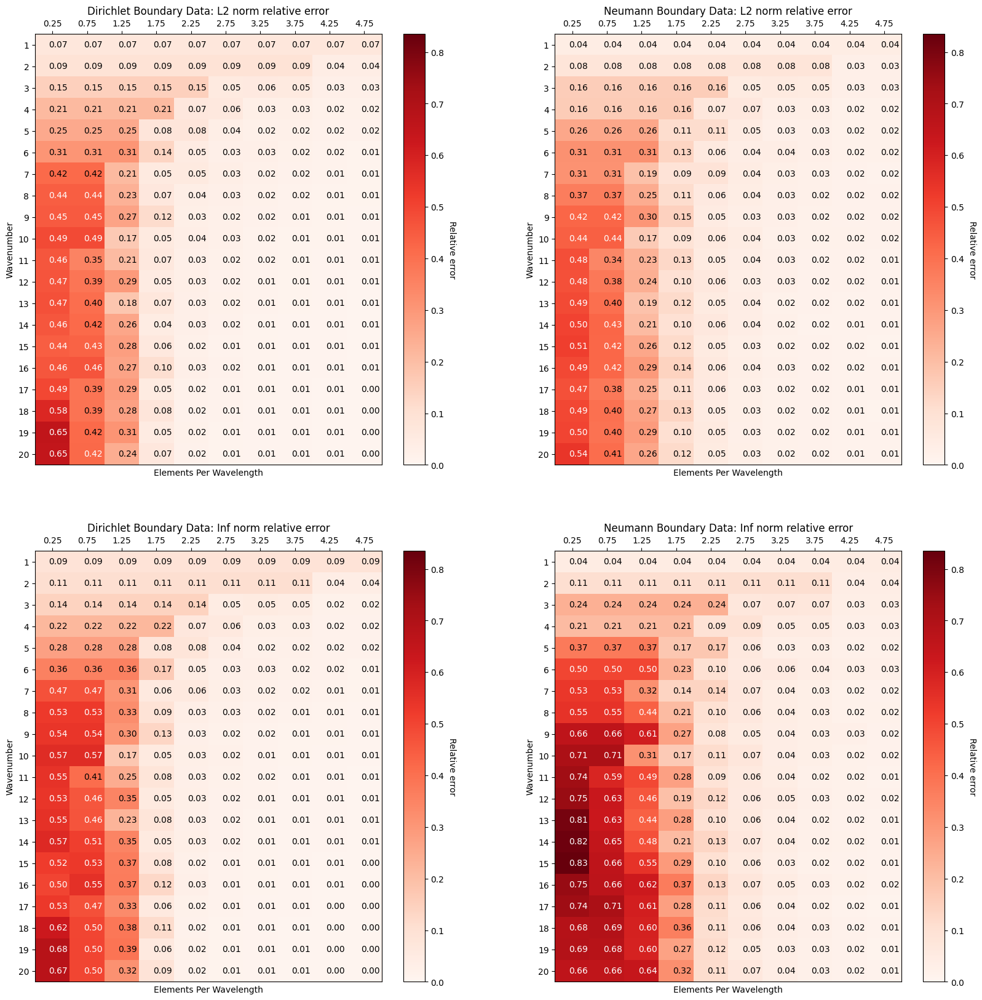

In [2]:
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline

axs = (plt.figure(figsize=(10 * 2, 10 * 2)).subplot_mosaic([
    ["fro_dirichlet", "fro_neumann"],
    ["inf_dirichlet", "inf_neumann"]]))

plt_info = [
    (axs["fro_dirichlet"], "Dirichlet Boundary Data: L2 norm relative error" , fro_rel_error_D),
    (axs["fro_neumann"]  , "Neumann Boundary Data: L2 norm relative error"   , fro_rel_error_N),
    (axs["inf_dirichlet"], "Dirichlet Boundary Data: Inf norm relative error", inf_rel_error_D),
    (axs["inf_neumann"]  , "Neumann Boundary Data: Inf norm relative error"  , inf_rel_error_N),
]

vmin = 0
vmax = np.amax((fro_rel_error_D, fro_rel_error_N, inf_rel_error_D, inf_rel_error_N))

for i, (ax, title, data) in enumerate(plt_info):
    ax.set_title(title)
        
    # Plot data
    im = ax.imshow(data, cmap='Reds', aspect='auto', vmin=vmin, vmax=vmax)

    # Colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Relative error', rotation=-90, va="bottom")

    # Set labels
    ax.set_xlabel('Elements Per Wavelength')
    ax.set_ylabel('Wavenumber')
    ax.set_xticks(np.arange(data.shape[1]), labels=params.ELEM_WAVELENGTH)
    ax.set_yticks(np.arange(data.shape[0]), labels=params.WAVE_NUMBERS)

    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)

    # Value in each cell
    for (i,j), value in np.ndenumerate(data):
        ax.text(j-.1, i+.1, f'{value:0.2f}', color = 'black' if value < vmax/2 else 'white')

# Plotting

We can visually inspect specific wavenumbers. The following code shows a comparison between plots in the same resolution between the analytical and bempp results, for increasing elements per wavelegth. 

First of all, choose the wavenumber to inpect.

In [3]:
k = 20

Now you can run the plotting.

In [4]:
samples_dirichlet = []
samples_neumann = []

# Load analytical solutions first
fname_a = params.FNAME_A(k)
fpath_a_d = os.path.join(params.PATH_A_D, fname_a)
fpath_a_n = os.path.join(params.PATH_A_N, fname_a)
    
analytical_d, it_a_d = np.load(fpath_a_d, allow_pickle=True)
samples_dirichlet.append(analytical_d)

analytical_n, it_a_n = np.load(fpath_a_n, allow_pickle=True)
samples_neumann.append(analytical_n)

# Now add BEM solutions
for n in params.ELEM_WAVELENGTH:
    fname_b = params.FNAME_B(k, n)
    fpath_b_d = os.path.join(params.PATH_B_D, fname_b)
    fpath_b_n = os.path.join(params.PATH_B_N, fname_b)
    
    bem_d, it_b_d = np.load(fpath_b_d, allow_pickle=True)
    samples_dirichlet.append(bem_d)
  
    bem_n, it_b_n = np.load(fpath_b_n, allow_pickle=True)
    samples_neumann.append(bem_n)

#### Dirichlet Plotting

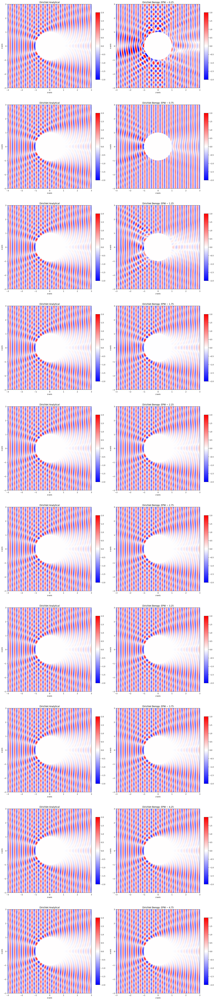

In [5]:
nrows = len(params.ELEM_WAVELENGTH)
ncols = 2
axs = (plt.figure(figsize=(10*ncols, 10*nrows)).subplots(nrows=nrows, ncols=ncols))

plt_info = [
    (
        (axs[i-1][0], 'Dirichlet Analytical', samples_dirichlet[0]),
        (axs[i-1][1], f'Dirichlet Bempp: EPW ~ {n}', samples_dirichlet[i]) 
    ) for i, n in enumerate(params.ELEM_WAVELENGTH, start=1)
]

for each_row in plt_info:
    for (ax, title, data) in each_row:
        ax.set_title(title)
        ax.set_xlabel('z-axis')
        ax.set_ylabel('x-axis')
        im = ax.imshow(data,
                        extent=[params.DMIN, params.DMAX, params.DMIN, params.DMAX],
                        vmin=-2, vmax=2,
                      cmap='bwr')
        cax = ax.inset_axes([1.05, 0.1, 0.05, 0.8])
        plt.colorbar(im, ax=ax, cax=cax)

#### Neumann Plotting

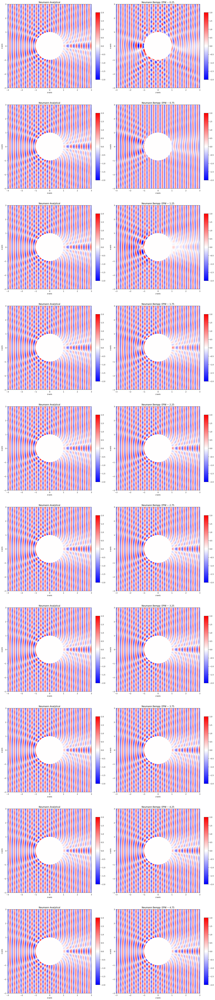

In [6]:
nrows = len(params.ELEM_WAVELENGTH)
ncols = 2
axs = (plt.figure(figsize=(10*ncols, 10*nrows)).subplots(nrows=nrows, ncols=ncols))

plt_info = [
    (
        (axs[i-1][0], 'Neumann Analytical', samples_neumann[0]),
        (axs[i-1][1], f'Neumann Bempp: EPW ~ {n}', samples_neumann[i]) 
    ) for i, n in enumerate(params.ELEM_WAVELENGTH, start=1)
]

for each_row in plt_info:
    for (ax, title, data) in each_row:
        ax.set_title(title)
        ax.set_xlabel('z-axis')
        ax.set_ylabel('x-axis')
        im = ax.imshow(data,
                        extent=[params.DMIN, params.DMAX, params.DMIN, params.DMAX],
                        vmin=-2, vmax=2,
                      cmap='bwr')
        cax = ax.inset_axes([1.05, 0.1, 0.05, 0.8])
        plt.colorbar(im, ax=ax, cax=cax)